# Model 2 - Overthrust - Generate data low frequency

In [1]:
using PyPlot, HDF5, SegyIO, JUDI, SlimOptim, Statistics, Random

In [2]:
# Load starting model
n,d,o,m0,m = read(h5open("$(JUDI.JUDI_DATA)/overthrust_model.h5","r"), "n", "d", "o", "m0", "m")
model = Model((n[1],n[2]), (d[1],d[2]), (o[1],o[2]), m);
model0 = Model((n[1],n[2]), (d[1],d[2]), (o[1],o[2]), m0);

In [3]:
v = sqrt.(1f0 ./ m);
v0 = sqrt.(1f0 ./ m0);

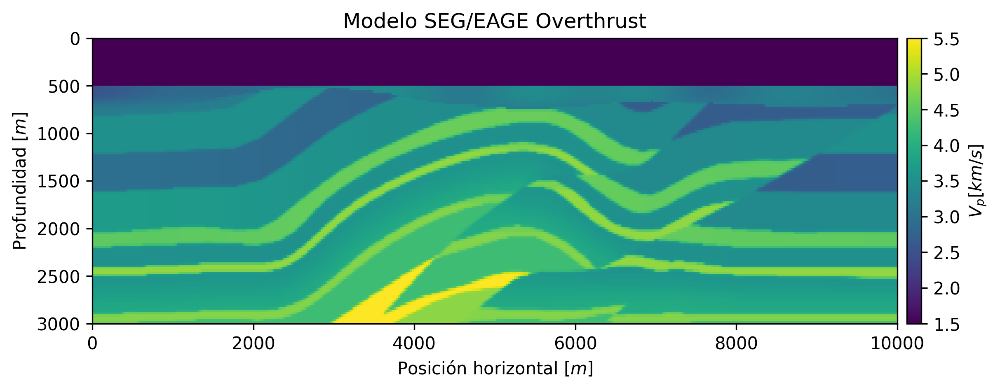

In [4]:
fig=figure(figsize=(10,3), dpi=300);
im = imshow(v', cmap="viridis", extent=[0, (n[1]-1)*d[1], (n[2]-1)*d[2], 0], aspect="auto")
cb = colorbar(im, pad=0.01)
cb[:set_label](label = L"$V_p [km/s]$")
xlabel(L"Posición horizontal $[m]$")
ylabel(L"Profundidad $[m]$")
title("Modelo SEG/EAGE Overthrust")
display(fig)

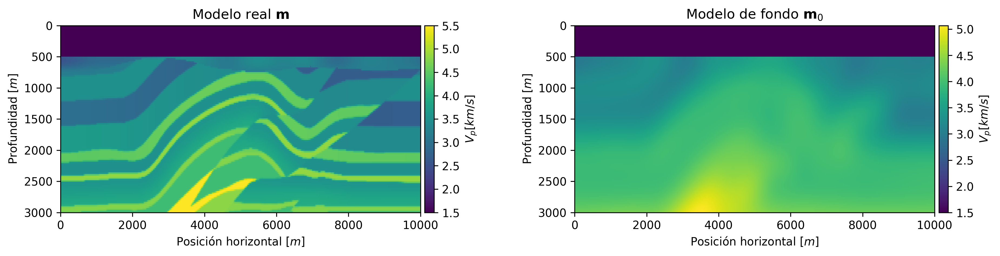

In [5]:
fig=figure(figsize=(15,3), dpi=300);
subplot(121)
im = imshow(v', cmap="viridis", extent=[0, (n[1]-1)*d[1], (n[2]-1)*d[2], 0], aspect="auto")
cb = colorbar(im, pad=0.01)
cb[:set_label](label = L"$V_p [km/s]$")
xlabel(L"Posición horizontal $[m]$")
ylabel(L"Profundidad $[m]$")
title(L"Modelo real $\mathbf{m}$")
subplot(122)
im = imshow(v0', cmap="viridis", extent=[0, (n[1]-1)*d[1], (n[2]-1)*d[2], 0], aspect="auto")
cb = colorbar(im, pad=0.01)
cb[:set_label](label = L"$V_p [km/s]$")
xlabel(L"Posición horizontal $[m]$")
ylabel(L"Profundidad $[m]$")
title(L"Modelo de fondo $\mathbf{m}_0$")
display(fig)

## Geometria de adquisicion

In [6]:
# Fuentes
nsrc = 16
# Receptores
nxrec = 201
xrec = range(0f0, stop=((n[1]-1)*d[1]), length=nxrec)
yrec = 0f0 # Cero para el eje y, 2D
zrec = range(50f0, stop=30f0, length=nxrec)

# intervalo de tiempo y tiempo total de grabacion
timeD = 2000f0   # tiempo de grabacion [ms]
dtD = 4f0    # intervalo de muestreo [ms]

# Set up receiver structure
recGeometry = Geometry(xrec, yrec, zrec; dt=dtD, t=timeD, nsrc=nsrc)

xsrc = convertToCell(range(400f0, stop=((n[1]-1)*d[1]-400), length=nsrc))
ysrc = convertToCell(range(0f0, stop=0f0, length=nsrc))
zsrc = convertToCell(range(50f0, stop=50f0, length=nsrc))

# Set up source structure
srcGeometry = Geometry(xsrc, ysrc, zsrc; dt=dtD, t=timeD)

GeometryIC{Float32} wiht 16 sources


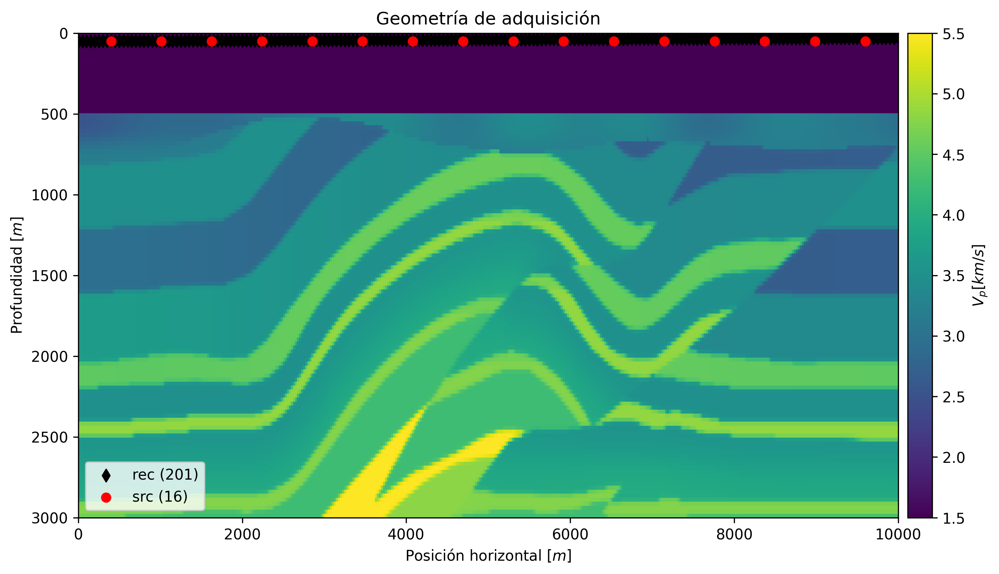

In [7]:
fig=figure(figsize=(12,6), dpi=300);
im = imshow(v', cmap="viridis", extent=[0, (n[1]-1)*d[1], (n[2]-1)*d[2], 0], aspect="auto")
scatter(xrec, zrec, label="rec (201)", color="black", marker="d")
scatter(xsrc, zsrc, label="src (16)", color="red")
cb = colorbar(im, pad=0.01)
cb[:set_label](label = L"$V_p [km/s]$")
xlabel(L"Posición horizontal $[m]$")
ylabel(L"Profundidad $[m]$")
title("Geometría de adquisición")
legend(loc = "lower left");
display(fig)

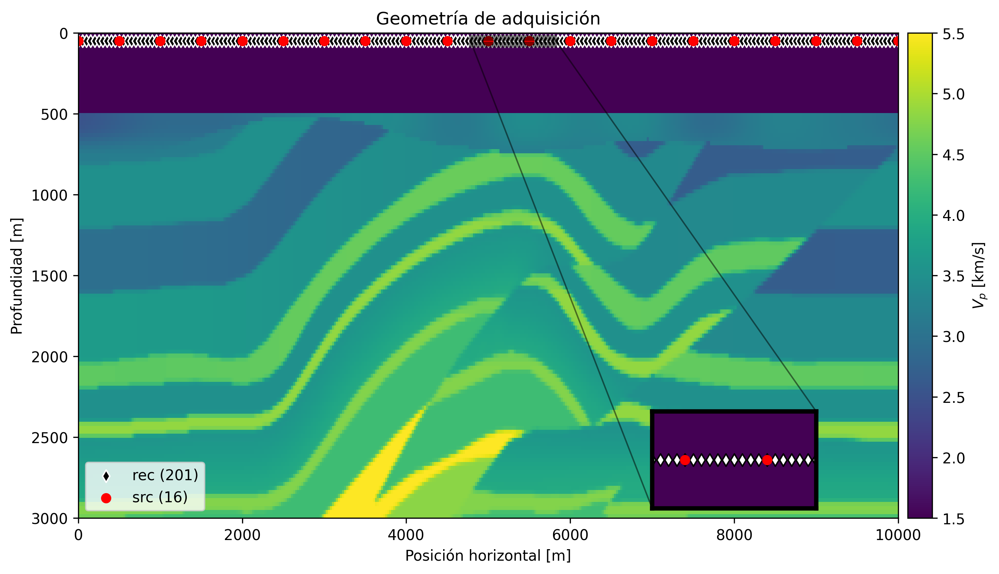

In [17]:
using PyPlot

fig, axis = plt.subplots(figsize=(12, 6), dpi = 300) # dpi=300
im = plt.imshow(v', cmap="viridis", extent=[0, 10000, 3000, 0], aspect="auto")
xrec = range(0.0, stop=10000.0, length=201)  # Valores de ejemplo para xrec
zrec = fill(50.0, 201)  # Valores de ejemplo para zrec
plt.scatter(xrec, zrec, label="rec (201)", color="black", marker="d", edgecolors="white")
xsrc = range(0.0, stop=10000, length=21)  # Valores de ejemplo para xsrc
zsrc = fill(50.0, 21)  # Valores de ejemplo para zsrc
plt.scatter(xsrc, zsrc, label="src (16)", color="red")
cb = plt.colorbar(im, pad=0.01)
cb.set_label(L"$V_p$ [km/s]")

# Inset
axin = axis.inset_axes([0.7, 0.02, 0.2, 0.2])
c1 = "#000000"
plt.setp(axin.spines.values(), color=c1, linewidth=3)
axin.imshow(v', cmap="viridis", extent=[0, 10000, 3000, 0], aspect="auto")
axin.scatter(xrec, zrec, label="rec (101)", color="white", marker="d", edgecolors="k") #, edgecolors="white"
axin.scatter(xsrc, zsrc, label="src (21)", color="red")
axin.set_xlim(4800, 5800)
axin.set_ylim(30, 70)
axin.set_xticks([])
axin.set_yticks([])
axis.indicate_inset_zoom(axin, edgecolor=c1, linewidth=4)

plt.xlabel("Posición horizontal [m]")
plt.ylabel("Profundidad [m]")
plt.title("Geometría de adquisición")
plt.legend()
display(fig)

## Low frequency - 4 Hz

In [8]:
# Ondicula
f0 = 0.004f0     # kHz 4Hz
wavelet = ricker_wavelet(timeD, dtD, f0)
q = judiVector(srcGeometry, wavelet)

judiVector{Float32, Matrix{Float32}} with 16 sources


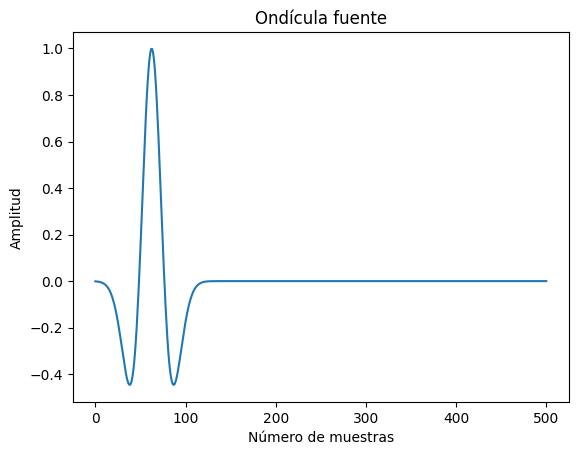

In [9]:
fig=figure()
plot(wavelet)
xlabel("Número de muestras")
ylabel("Amplitud")
title("Ondícula fuente")
display(fig)

In [10]:
opt = Options(optimal_checkpointing = true)    # set to false to disable optimal checkpointing
# Operadores
Pr = judiProjection(recGeometry)
F = judiModeling(model; options=opt)
F0 = judiModeling(model0; options=opt)
Ps = judiProjection(srcGeometry)
J = judiJacobian(Pr*F0*adjoint(Ps), q)

JUDI born{Float32} propagator (z * x) -> (src * rec * time)


### Datos observados $d_{\text{obs}}$

In [11]:
# Modelado no lineal
d_obs = Pr*F*adjoint(Ps)*q

Building forward operator
/home/geouser/.local/lib/python3.9/site-packages/numpy/core/getlimits.py:518: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/home/geouser/.local/lib/python3.9/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  return self._float_to_str(self.smallest_subnormal)
Operator `forward` ran in 0.03 s
Operator `forward` ran in 0.03 s
Operator `forward` ran in 0.03 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.05 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.05 s
Operator `forward` ran in 0.03 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s


judiVector{Float32, Matrix{Float32}} with 16 sources


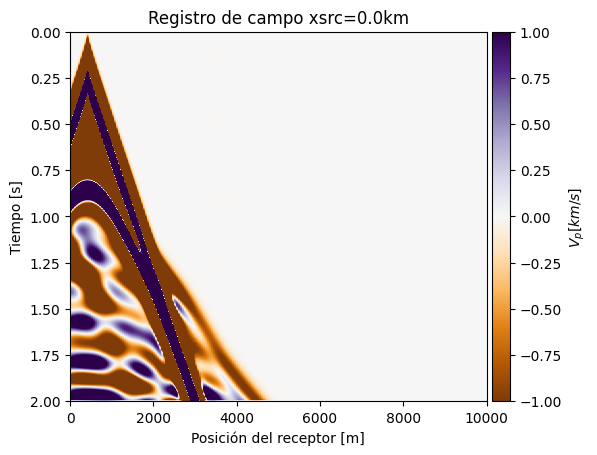

In [13]:
fig = figure() #dpi=300
im = imshow(d_obs.data[1], vmin=-1, vmax=1, cmap="PuOr", extent=[xrec[1], xrec[end], timeD/1000, 0], aspect="auto")
cb = colorbar(im, pad=0.01)
cb[:set_label](label = L"$V_p [km/s]$")
xlabel("Posición del receptor [m]")
ylabel("Tiempo [s]")
title("Registro de campo xsrc=0.0km")
display(fig)

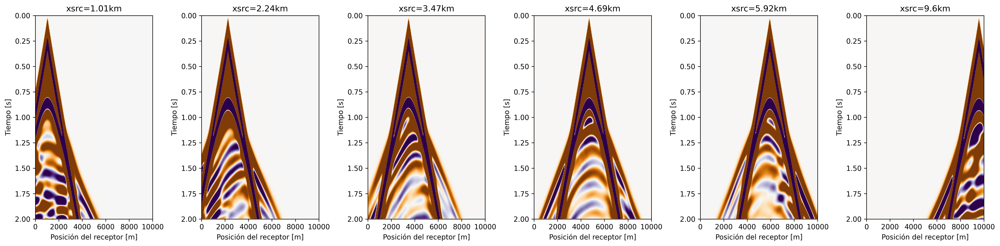

In [79]:
fig=figure(figsize=(20, 5), dpi=300) #, dpi=300
for i=1:6
    subplot(1, 6, i)
    imshow(d_obs.data[2*i], vmin=-1, vmax=1, cmap="PuOr", extent=[xrec[1], xrec[end], timeD/1000, 0], aspect="auto")
    xlabel("Posición del receptor [m]")
    ylabel("Tiempo [s]")
    title("xsrc=$(round(1f-3xsrc[2*i][1]; digits = 2))km")
end
subplot(1, 6, 6)
    imshow(d_obs.data[end], vmin=-1, vmax=1, cmap="PuOr", extent=[xrec[1], xrec[end], timeD/1000, 0], aspect="auto")
    xlabel("Posición del receptor [m]")
    ylabel("Tiempo [s]")
    title("xsrc=$(round(1f-3xsrc[end][1]; digits = 2))km")
tight_layout()
display(fig)

### Datos lineales 

In [80]:
dm = vec(model.m - model0.m);

In [81]:
# Linearized modeling J*dm
dD = J*dm

Operator `born` ran in 0.07 s
Operator `born` ran in 0.05 s
Operator `born` ran in 0.07 s
Operator `born` ran in 0.06 s
Operator `born` ran in 0.06 s
Operator `born` ran in 0.06 s
Operator `born` ran in 0.06 s
Operator `born` ran in 0.09 s
Operator `born` ran in 0.07 s
Operator `born` ran in 0.07 s
Operator `born` ran in 0.06 s
Operator `born` ran in 0.13 s
Operator `born` ran in 0.10 s
Operator `born` ran in 0.07 s
Operator `born` ran in 0.07 s
Operator `born` ran in 0.07 s


judiVector{Float32, Matrix{Float32}} with 16 sources


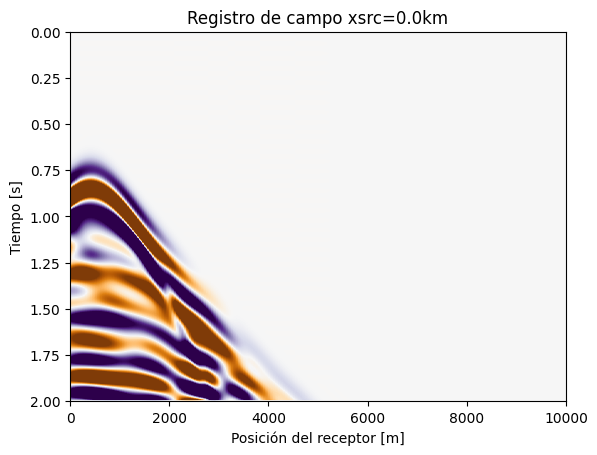

In [82]:
fig = figure() #dpi=300
imshow(dD.data[1], vmin=-1, vmax=1, cmap="PuOr", extent=[xrec[1], xrec[end], timeD/1000, 0], aspect="auto")
xlabel("Posición del receptor [m]")
ylabel("Tiempo [s]")
title("Registro de campo xsrc=0.0km")
display(fig)

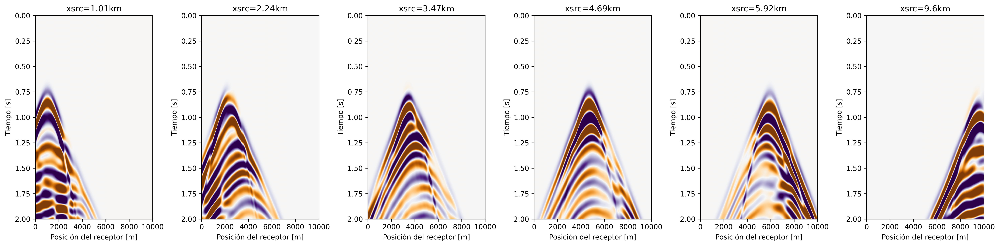

In [83]:
fig=figure(figsize=(20, 5), dpi=300) #, dpi=300
for i=1:6
    subplot(1, 6, i)
    imshow(dD.data[2*i], vmin=-1, vmax=1, cmap="PuOr", extent=[xrec[1], xrec[end], timeD/1000, 0], aspect="auto")
    xlabel("Posición del receptor [m]")
    ylabel("Tiempo [s]")
    title("xsrc=$(round(1f-3xsrc[2*i][1]; digits = 2))km")
end
subplot(1, 6, 6)
    imshow(dD.data[end], vmin=-1, vmax=1, cmap="PuOr", extent=[xrec[1], xrec[end], timeD/1000, 0], aspect="auto")
    xlabel("Posición del receptor [m]")
    ylabel("Tiempo [s]")
    title("xsrc=$(round(1f-3xsrc[end][1]; digits = 2))km")
tight_layout()
display(fig)

### Modelos y SEG-Y

In [84]:
save("model_overthrust.jld", "n", n, "d", d, "o", o, "m", m, "m0", m0, "dm", dm)

In [85]:
block = judiVector_to_SeisBlock(d_obs, q)
segy_write("model_overthrust_low_f.segy", block)  # writes a SEG-Y file called new_file.segy

In [87]:
block = judiVector_to_SeisBlock(dD, q)
segy_write("model_overthrust_low_f_lin.segy", block)  # writes a SEG-Y file called new_file.segy

## High frequency 8

In [14]:
# Ondicula
f0 = 0.008f0     # kHz 20Hz
wavelet = ricker_wavelet(timeD, dtD, f0)
q = judiVector(srcGeometry, wavelet)

judiVector{Float32, Matrix{Float32}} with 16 sources


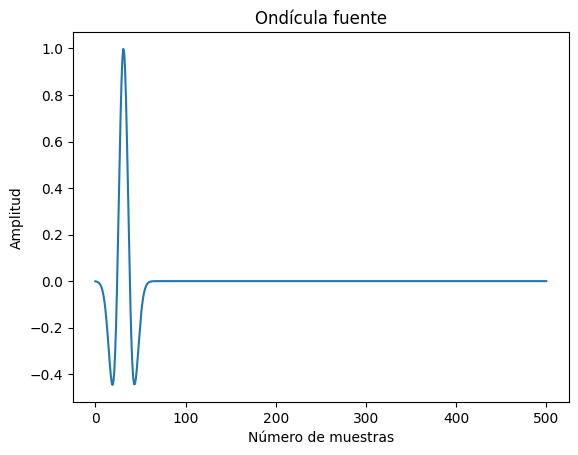

In [15]:
fig=figure()
plot(wavelet)
xlabel("Número de muestras")
ylabel("Amplitud")
title("Ondícula fuente")
display(fig)

In [90]:
opt = Options(optimal_checkpointing = true)    # set to false to disable optimal checkpointing
# Operadores
Pr = judiProjection(recGeometry)
F = judiModeling(model; options=opt)
F0 = judiModeling(model0; options=opt)
Ps = judiProjection(srcGeometry)
J = judiJacobian(Pr*F0*adjoint(Ps), q)

JUDI born{Float32} propagator (z * x) -> (src * rec * time)


In [91]:
# Modelado no lineal
d_obs = Pr*F*adjoint(Ps)*q

Operator `forward` ran in 0.03 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.05 s
Operator `forward` ran in 0.06 s
Operator `forward` ran in 0.04 s
Operator `forward` ran in 0.05 s


judiVector{Float32, Matrix{Float32}} with 16 sources


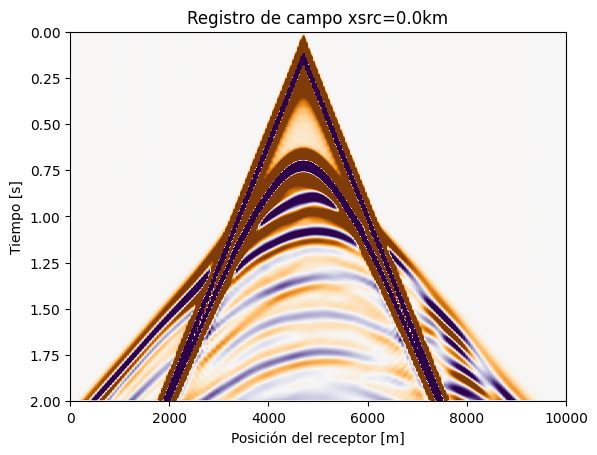

In [93]:
fig = figure() #dpi=300
imshow(d_obs.data[8], vmin=-1, vmax=1, cmap="PuOr", extent=[xrec[1], xrec[end], timeD/1000, 0], aspect="auto")
xlabel("Posición del receptor [m]")
ylabel("Tiempo [s]")
title("Registro de campo xsrc=0.0km")
display(fig)

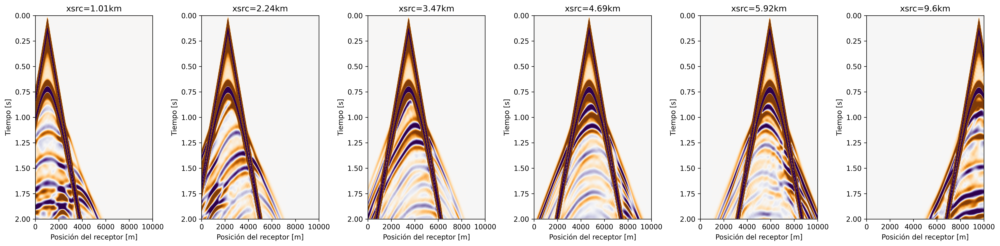

In [94]:
fig=figure(figsize=(20, 5), dpi=300) #, dpi=300
for i=1:6
    subplot(1, 6, i)
    imshow(d_obs.data[2*i], vmin=-1, vmax=1, cmap="PuOr", extent=[xrec[1], xrec[end], timeD/1000, 0], aspect="auto")
    xlabel("Posición del receptor [m]")
    ylabel("Tiempo [s]")
    title("xsrc=$(round(1f-3xsrc[2*i][1]; digits = 2))km")
end
subplot(1, 6, 6)
    imshow(d_obs.data[end], vmin=-1, vmax=1, cmap="PuOr", extent=[xrec[1], xrec[end], timeD/1000, 0], aspect="auto")
    xlabel("Posición del receptor [m]")
    ylabel("Tiempo [s]")
    title("xsrc=$(round(1f-3xsrc[end][1]; digits = 2))km")
tight_layout()
display(fig)

### Datos lineales 

In [95]:
dm = vec(model.m - model0.m);

In [96]:
# Linearized modeling J*dm
dD = J*dm

Operator `born` ran in 0.06 s
Operator `born` ran in 0.06 s
Operator `born` ran in 0.07 s
Operator `born` ran in 0.06 s
Operator `born` ran in 0.06 s
Operator `born` ran in 0.05 s
Operator `born` ran in 0.06 s
Operator `born` ran in 0.06 s
Operator `born` ran in 0.06 s
Operator `born` ran in 0.07 s
Operator `born` ran in 0.08 s
Operator `born` ran in 0.08 s
Operator `born` ran in 0.12 s
Operator `born` ran in 0.09 s
Operator `born` ran in 0.06 s
Operator `born` ran in 0.06 s


judiVector{Float32, Matrix{Float32}} with 16 sources


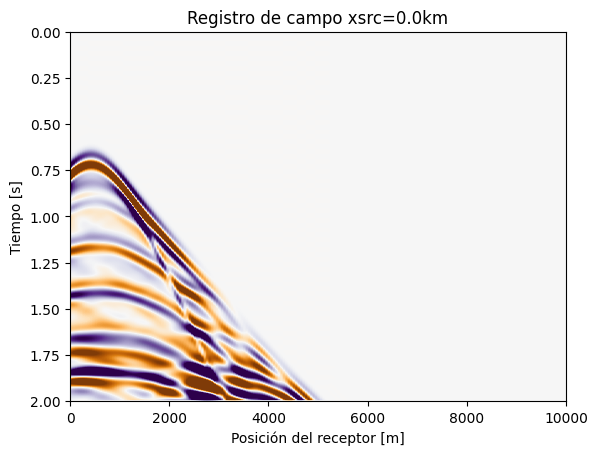

In [97]:
fig = figure() #dpi=300
imshow(dD.data[1], vmin=-1, vmax=1, cmap="PuOr", extent=[xrec[1], xrec[end], timeD/1000, 0], aspect="auto")
xlabel("Posición del receptor [m]")
ylabel("Tiempo [s]")
title("Registro de campo xsrc=0.0km")
display(fig)

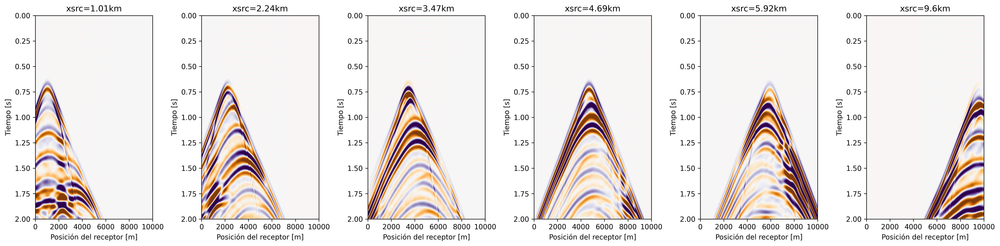

In [99]:
fig=figure(figsize=(20, 5), dpi=300) #, dpi=300
for i=1:6
    subplot(1, 6, i)
    imshow(dD.data[2*i], vmin=-1, vmax=1, cmap="PuOr", extent=[xrec[1], xrec[end], timeD/1000, 0], aspect="auto")
    xlabel("Posición del receptor [m]")
    ylabel("Tiempo [s]")
    title("xsrc=$(round(1f-3xsrc[2*i][1]; digits = 2))km")
end
subplot(1, 6, 6)
    imshow(dD.data[end], vmin=-1, vmax=1, cmap="PuOr", extent=[xrec[1], xrec[end], timeD/1000, 0], aspect="auto")
    xlabel("Posición del receptor [m]")
    ylabel("Tiempo [s]")
    title("xsrc=$(round(1f-3xsrc[end][1]; digits = 2))km")
tight_layout()
display(fig)

### SEG-Y

In [100]:
block = judiVector_to_SeisBlock(d_obs, q)
segy_write("model_overthrust_high_f.segy", block)  # writes a SEG-Y file called new_file.segy

In [101]:
block = judiVector_to_SeisBlock(dD, q)
segy_write("model_overthrust_high_f_lin.segy", block)  # writes a SEG-Y file called new_file.segy